(512, 512)


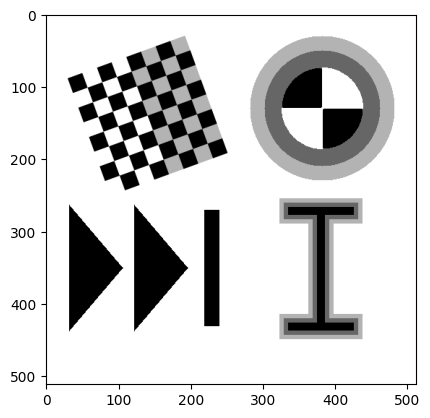

In [6]:
#computer Vision Lab 1
#Δωροθέα Κουμίδου 03119712
#Γιώργος Χαραλάμπους 03119706
#1.1.1
import cv2
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread("edgetest_24.png",cv2.IMREAD_GRAYSCALE)

#normalize image to [0,1]
image = image.astype(np.double)/255
#image= float(image/255)

img_height, img_width = image.shape
plt.imshow(image,cmap='gray')
print(image.shape)

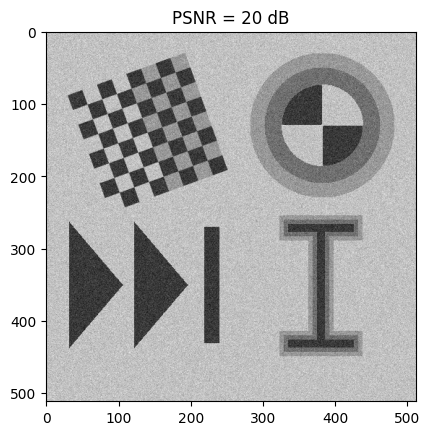

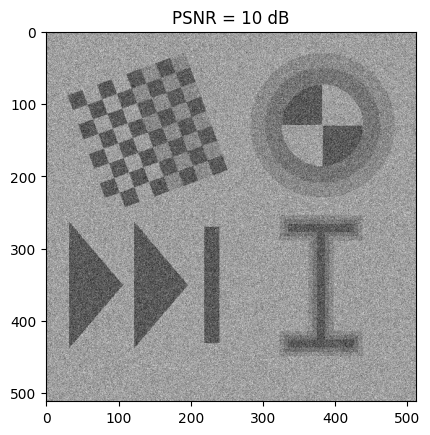

In [7]:
#1.1.2
#υπολογισμός τυπικής απόκλισης μέσω PSNR
import numpy as np

def sigma_n(PSNR: int,
          img_max:int,
          img_min:int):
  return ((img_max - img_min)/(10**(PSNR/20)))

img_max = image.max()
img_min = image.min()

#image 1: PSNR = 20 dB
PSNR1 = 20
image1 = image + np.random.normal(0,sigma_n(PSNR1,img_max,img_min),size=(img_height,img_width))
plt.title("PSNR = 20 dB")
plt.imshow(image1,cmap='gray')
plt.show()

#image 2: PSNR = 10 dB
PSNR2 = 10
image2 = image + np.random.normal(0,sigma_n(PSNR2,img_max,img_min),size=(img_height,img_width))
plt.title("PSNR = 10 dB")
plt.imshow(image2,cmap='gray')
plt.show()

1.2 ΥΛΟΠΟΙΗΣΗ ΑΛΓΟΡΥΘΜΩΝ ΑΝΙΧΝΕΥΣΗΣ ΑΚΜΩΝ

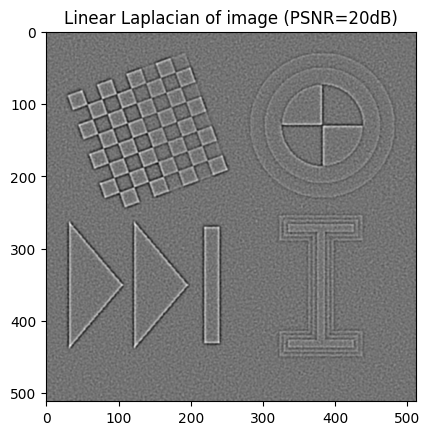

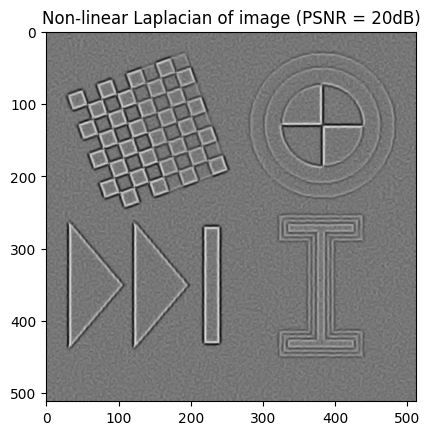

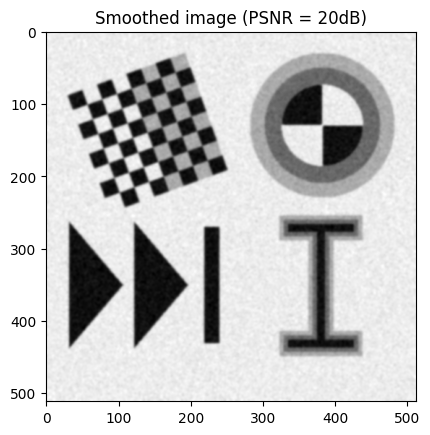

In [8]:
#1.2.1

#Smoothing
sigma = 1.5
n = int(2*np.ceil(3*sigma)+1)

G1D = cv2.getGaussianKernel(n,sigma) #1D gaussian filter
G2D = G1D @ G1D.T #symmetric 2D gaussian filter


def LoG(n,sigma):
  #cv2.Laplacian(G2D,cv2.CV_64F)
  x = np.linspace(-n/2,n/2,n)
  y = np.linspace(-n/2,n/2,n)
  X,Y = np.meshgrid(x,y)

  Z = (X**2 + Y**2-2*sigma**2)/(2*np.pi*sigma**6)
  Z *= np.exp(-(X**2+Y**2)/(2*sigma**2))
  return Z


#1.2.2
#The 2 types od Laplacian
L1 = cv2.filter2D(image1,-1,LoG(n,sigma))
plt.imshow(L1,cmap='gray')
plt.title("Linear Laplacian of image (PSNR=20dB)")
plt.show()

#Non-Linear (L2)
kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)

smoothed_img = cv2.filter2D(image1,-1,G2D)

L2 = cv2.dilate(smoothed_img,kernel)+cv2.erode(smoothed_img,kernel)-2*smoothed_img

plt.imshow(L2,cmap='gray')
plt.title("Non-linear Laplacian of image (PSNR = 20dB)")
plt.show()

plt.imshow(smoothed_img,cmap='gray')
plt.title("Smoothed image (PSNR = 20dB)")
plt.show()

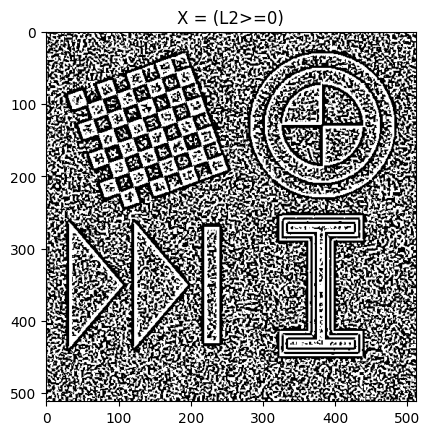

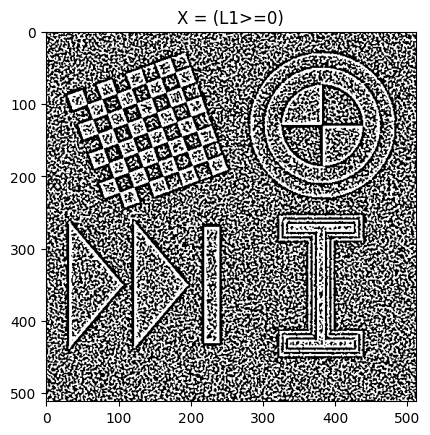

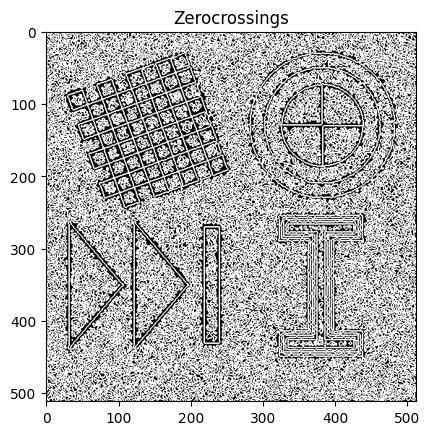

In [11]:
#1.2.3
X = (L2 >= 0) #pick only those pixels with non-zero values
X = X.astype(np.uint8)
plt.imshow(X,cmap="gray")
plt.title("X = (L2>=0)")
plt.show()


X = (L1 >= 0) #pick only those pixels with non-zero values
X = X.astype(np.uint8)
plt.imshow(X,cmap="gray")
plt.title("X = (L1>=0)")
plt.show()

#find image's zerocrossings
Y = cv2.dilate(X,kernel) - cv2.erode(X,kernel)
plt.imshow(Y,cmap="gray")
plt.title("Zerocrossings")
plt.show()


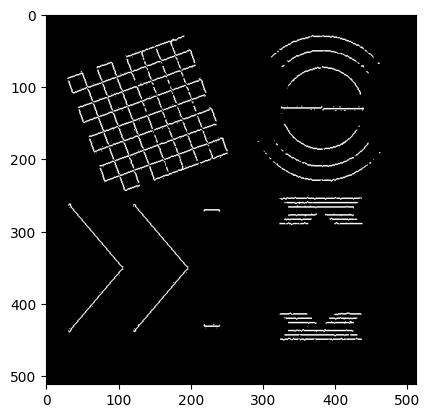

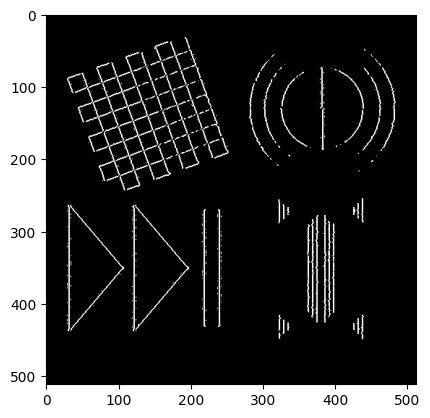

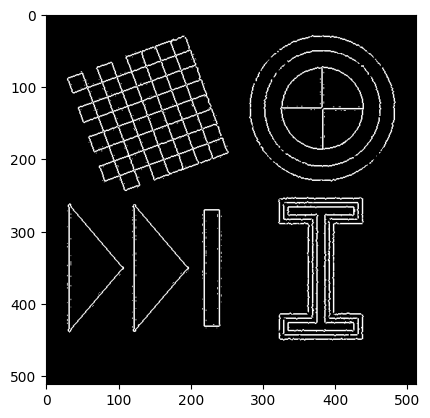

In [17]:
#1.2.4
#Threshold on Zerocrossing
height, width = Y.shape

img_gradient = np.array(np.gradient(smoothed_img))
theta = 0.2

#find the max values of both axis gradient
max1 = np.absolute(img_gradient[0]).max()
max2 = np.absolute(img_gradient[1]).max()

#find edges of both axis gradients
edges1 = (np.logical_and(Y==1,np.absolute(img_gradient[0])>theta*max1)).astype(int)
edges2 = (np.logical_and(Y==1,np.absolute(img_gradient[1])>theta*max2)).astype(int)

result = np.logical_or(edges1,edges2)

plt.imshow(edges1,cmap='gray')
plt.show()

plt.imshow(edges2,cmap='gray')
plt.show()

plt.imshow(result,cmap='gray')
plt.show()

In [18]:
def EdgeDetect(image:np.array,
               sigma:int,
               theta:int,
               type_of_filter:str):
  assert type_of_filter == 'linear' or type_of_filter == 'non-linear','Type should be "linear" or "non-linear"'

  #1.2.1
  #Filter Creation
  n = int(2*np.ceil(3*sigma)+1) #n: kernel size (n x n)

  gauccian_1D = cv2.getGaussianKernel(n,sigma)
  gauccian_2D = gauccian_1D @ gauccian_1D.T   #2D and symmetric gauccian filter

  def LoG(n,sigma): #return Laplacian-of-Gauccian filter
    x = np.linspace(-n/2,n/2,n)
    y = np.linspace(-n/2,n/2,n)
    X,Y = np.meshgrid(x,y)

    Z = (X**2 + Y**2-2*sigma**2)/(2*np.pi*sigma**6)
    Z *= np.exp(-(X**2+Y**2)/(2*sigma**2))
    return Z

  log = LoG(n,sigma)

  #1.2.2
  #Laplacian L (smoothing the image)
  kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)
  blur_img = cv2.filter2D(image,-1,gauccian_2D)

  #choose between L1 or L2 smoothing methods
  if type_of_filter == 'linear':
    L = cv2.filter2D(image,-1,log) #convolution of log and image
  elif type_of_filter == 'non-linear':
    L = cv2.dilate(blur_img,kernel)+cv2.erode(blur_img,kernel)-2*blur_img

  #1.2.3
  #Locating zerocrossings
  X = (L>=0)  #binary image
  X = X.astype(np.uint8)

  Y = cv2.dilate(X,kernel) - cv2.erode(X,kernel)

  #1.2.4
  #Finding the edges (threshold on zerocrossings)
  img_gradient = np.array(np.gradient(blur_img))

  #find the max values of both axis gradient
  max1 = np.absolute(img_gradient[0]).max()
  max2 = np.absolute(img_gradient[1]).max()

  #find edges of both axis gradients
  edges1 = (np.logical_and(Y==1,np.absolute(img_gradient[0])>theta*max1)).astype(int)
  edges2 = (np.logical_and(Y==1,np.absolute(img_gradient[1])>theta*max2)).astype(int)

  result = np.logical_or(edges1,edges2).astype(int)

  return result

Text(0.5, 1.0, 'non-linear with PSNR=10dB')

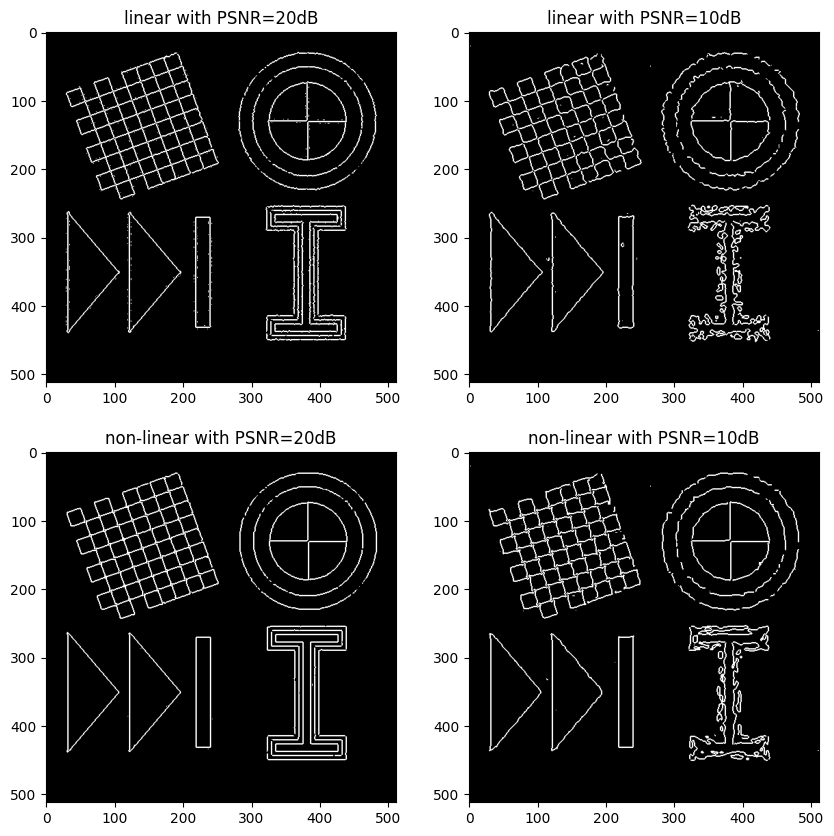

In [35]:
#Testing EdgeDetect on 2 different images
edges1 = EdgeDetect(image1,1.5,0.2,'linear') #Edges using PSNR=20dB
edges2 = EdgeDetect(image2,3,0.2,'linear')  #Edges using PSNR=10dB

fig,axis = plt.subplots(2,2,figsize=(10,10))
axis[0,0].imshow(edges1,cmap = "gray")
axis[0,0].set_title("linear with PSNR=20dB")
axis[0,1].imshow(edges2,cmap = "gray")
axis[0,1].set_title("linear with PSNR=10dB")

edges1 = EdgeDetect(image1,1.5,0.2,'non-linear') #Edges using PSNR=20dB
edges2 = EdgeDetect(image2,3,0.2,'non-linear')  #Edges using PSNR=10dB

axis[1,0].imshow(edges1,cmap = "gray")
axis[1,0].set_title("non-linear with PSNR=20dB")

axis[1,1].imshow(edges2,cmap = "gray")
axis[1,1].set_title("non-linear with PSNR=10dB")



1.3 ΑΞΙΟΛΟΓΗΣΗ ΑΠΟΤΕΛΕΣΜΑΤΩΝ ΑΝΙΧΝΕΥΣΗΣ ΑΚΜΩΝ


Text(0.5, 1.0, '"Real" edges of original image')

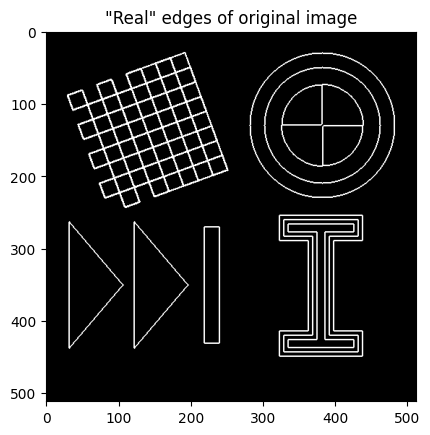

In [34]:
#1.3.1
#Finding "real" edges
def real_edges_detect(image,theta_real):
  kernel = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)

  M = cv2.dilate(image,kernel) - cv2.erode(image,kernel)
  T = M>theta_real
  T = T.astype(np.uint8)
  return T

real_edges = real_edges_detect(image,0.1)

plt.imshow(real_edges,cmap = "gray")
plt.title('"Real" edges of original image')

In [39]:
#1.3.2
def detection_quality(real_edges,
                      my_edges):
  precision = (real_edges & my_edges).sum()/real_edges.sum()
  recall = (real_edges & my_edges).sum()/my_edges.sum()

  return (precision+recall)/2

print("Η ποσοτική αξιολόγηση για PSNR=10dB είναι:", detection_quality(real_edges,edges2))
print("Η ποσοτική αξιολόγηση για PSNR=20dB είναι:", detection_quality(real_edges,edges1))

Η ποσοτική αξιολόγηση για PSNR=10dB είναι: 0.6727374721897942
Η ποσοτική αξιολόγηση για PSNR=20dB είναι: 0.9213805119645617


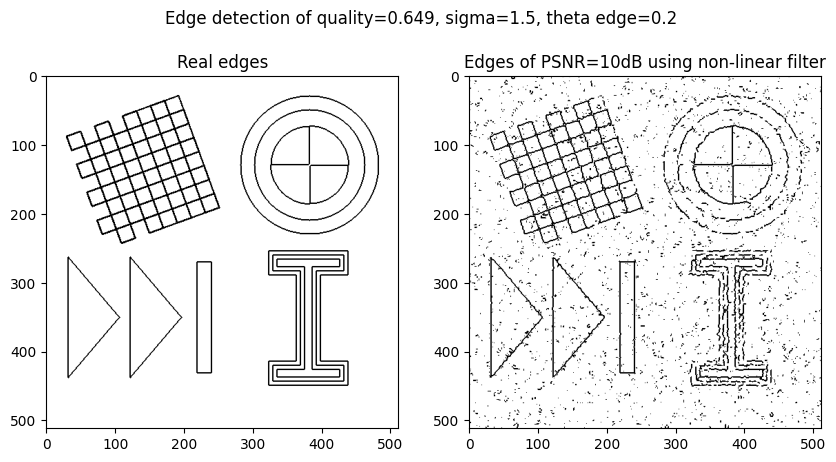

0.6491215092260217

In [45]:
#1.3.3
def testing(image, PSNR, theta_edge, theta_real,sigma,filter_type):
  img_height, img_width = image.shape
  img_max = image.max()
  img_min = image.min()
  noise_sigma = sigma_n(PSNR,img_max,img_min)

  #apply noise to the image
  noised_img = image + np.random.normal(0,noise_sigma,size=(img_height,img_width))

  #find edges of noised image
  noised_edges = EdgeDetect(noised_img,sigma,theta_edge,filter_type)

  #find real edges
  real_edges = real_edges_detect(image,theta_real)

  #calculate quality
  quality = detection_quality(real_edges,noised_edges)
  q = round(quality,3)
  fig ,axis = plt.subplots(1,2,figsize = (10,5))
  axis[0].imshow(real_edges,cmap="gray_r")
  axis[0].set_title("Real edges")
  axis[1].imshow(noised_edges,cmap = "gray_r")
  axis[1].set_title(f"Edges of PSNR={PSNR}dB using {filter_type} filter")
  fig.suptitle(f"Edge detection of quality={q}, sigma={sigma}, theta edge={theta_edge}")
  plt.show()

  return quality

testing(image,PSNR=10,theta_edge=0.2,theta_real=0.1,sigma=1.5,filter_type='non-linear')

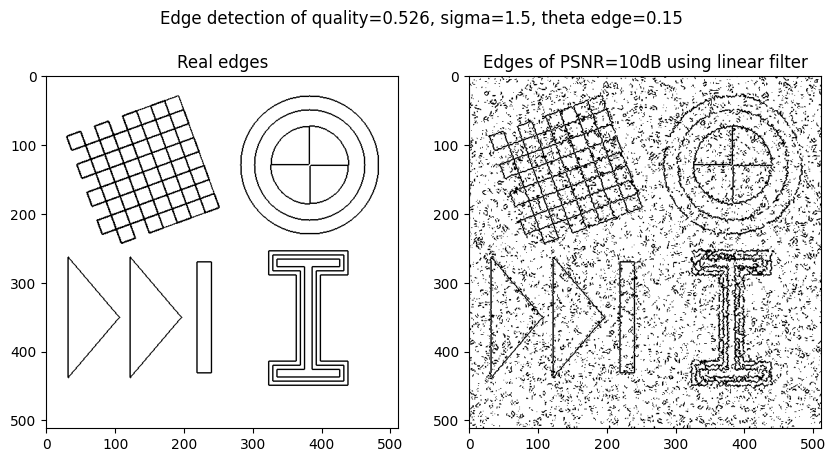

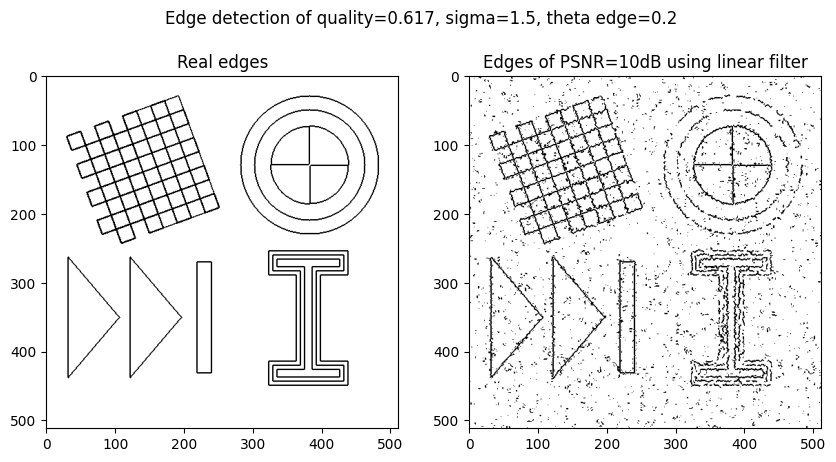

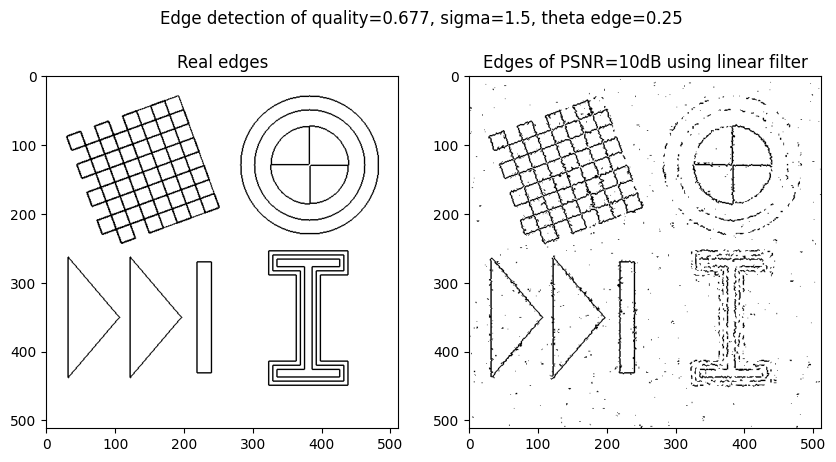

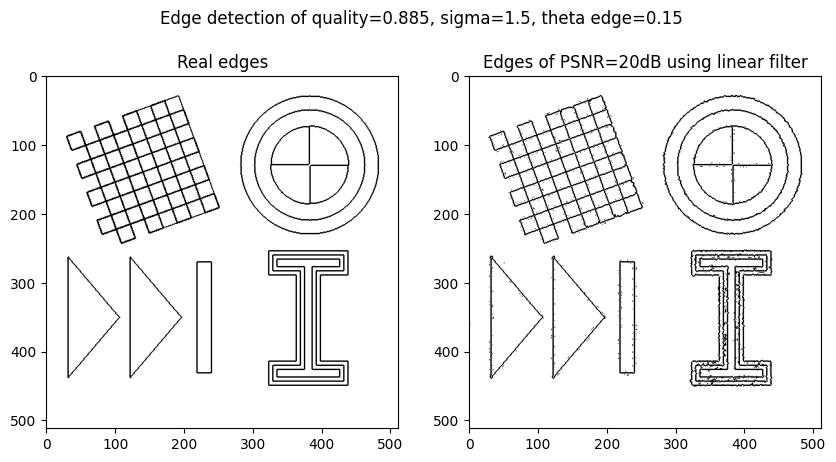

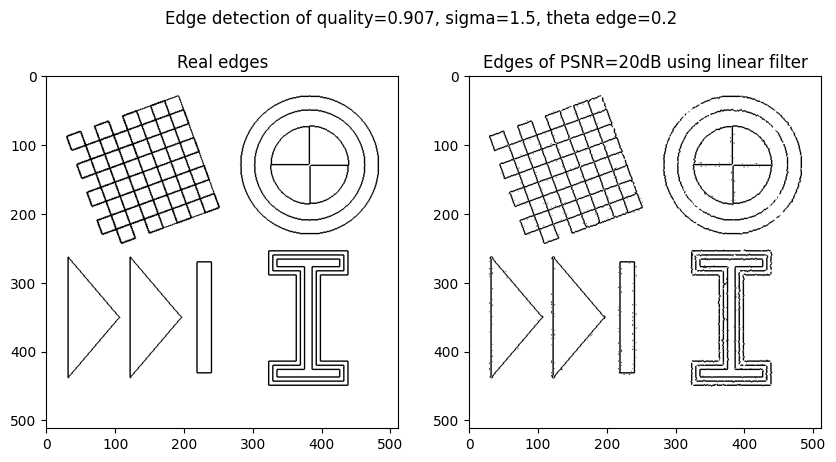

...

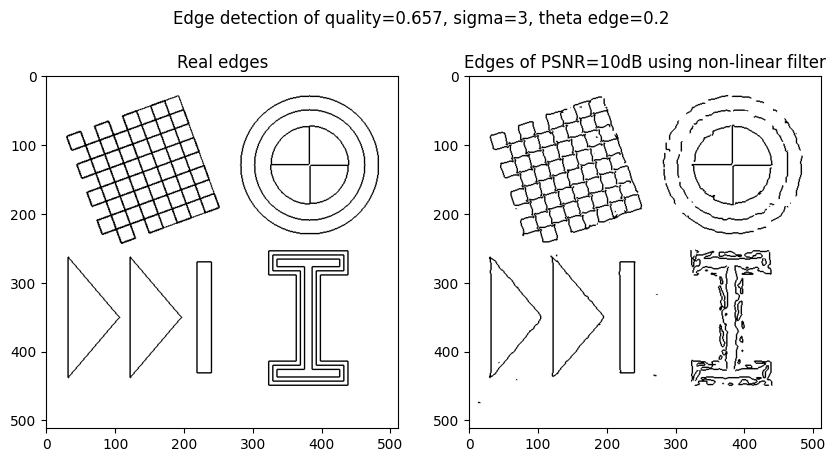

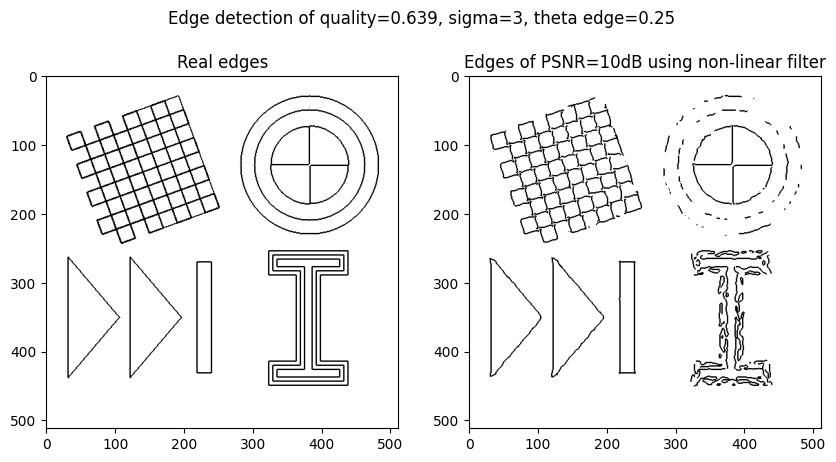

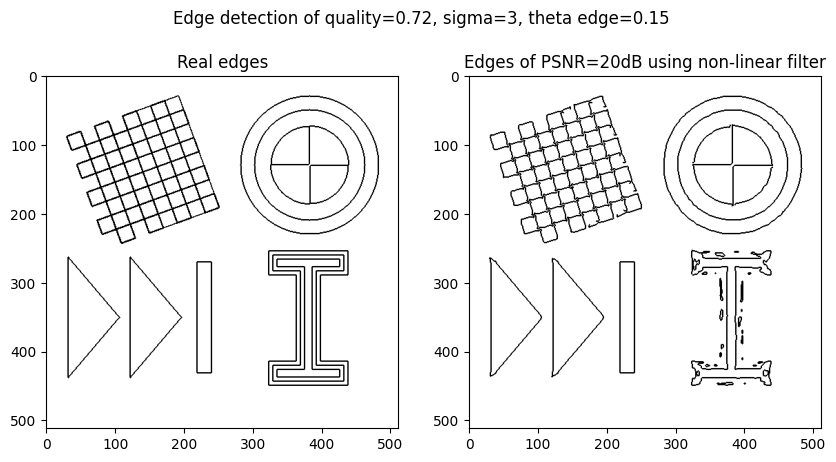

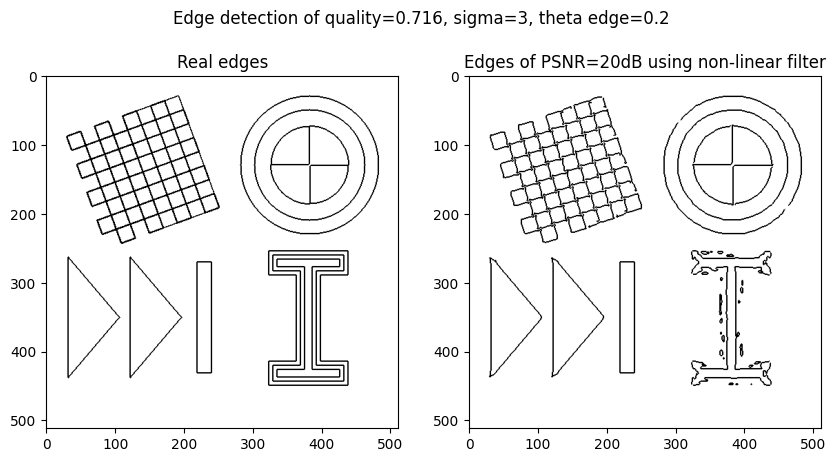

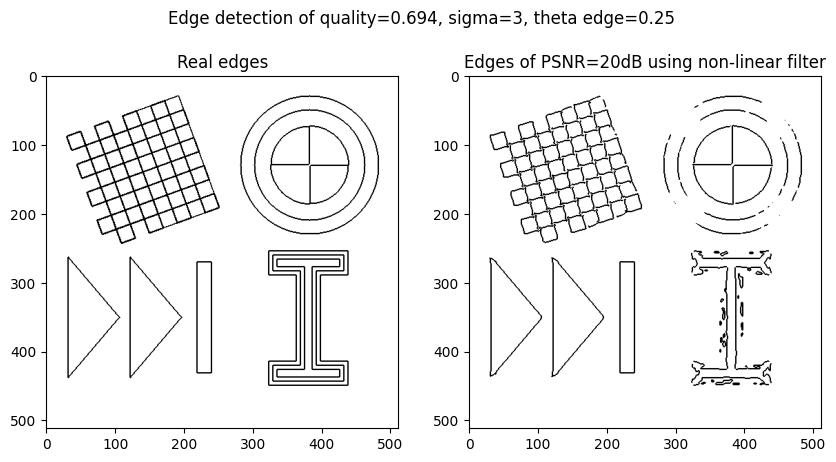

In [47]:
#1.3.3
#Testing session

#Test several sigma,theta,PSNR on L1 filtering
theta_real = 0.2

filters = ['linear','non-linear']
sigmas = [1.5,2,2.5,3]
PSNR = [10,20]
thetas = [ 0.15,0.2, 0.25]

for f in filters:
  for s in sigmas:
    for p in PSNR:
      for th in thetas:
        q = testing(image=image,PSNR=p,theta_edge=th,theta_real=theta_real,sigma=s,filter_type=f)

1.4 ΕΦΑΡΜΟΓΗ ΣΕ ΠΡΑΓΜΑΤΙΚΕΣ ΕΙΚΟΝΕΣ

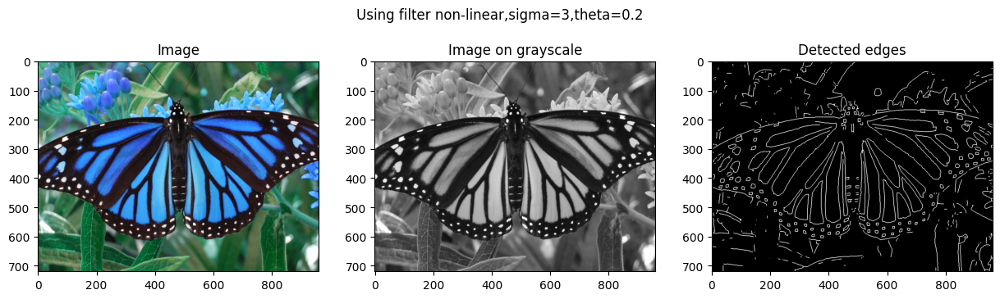

In [42]:
real_image = cv2.imread("butterfly.jpg")
gray_image = cv2.imread("butterfly.jpg",cv2.IMREAD_GRAYSCALE)

gray_image = gray_image.astype(np.uint8)/255

sigma = 3
theta = 0.2
filter = 'non-linear'

detected_edges = EdgeDetect(gray_image,sigma=sigma,theta=theta,type_of_filter=filter)

fig,axis = plt.subplots(1,3,figsize=(15,4))
axis[0].imshow(real_image)
axis[0].set_title("Image")
axis[1].imshow(gray_image,cmap="gray")
axis[1].set_title("Image on grayscale")
axis[2].imshow(detected_edges,cmap='gray')
axis[2].set_title("Detected edges")
fig.suptitle(f"Using filter {filter},sigma={sigma},theta={theta}")
plt.show()

<ipython-input-39-a7f7a75b5aff>:5: RuntimeWarning: invalid value encountered in scalar divide
  recall = (real_edges & my_edges).sum()/my_edges.sum()


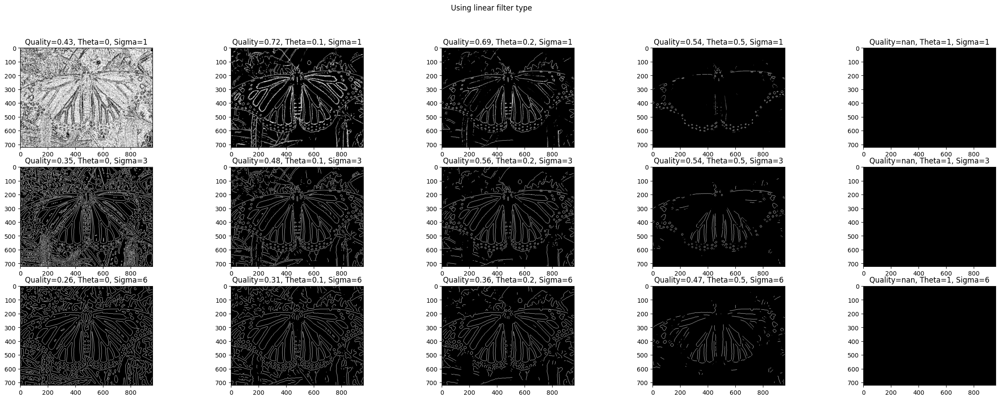

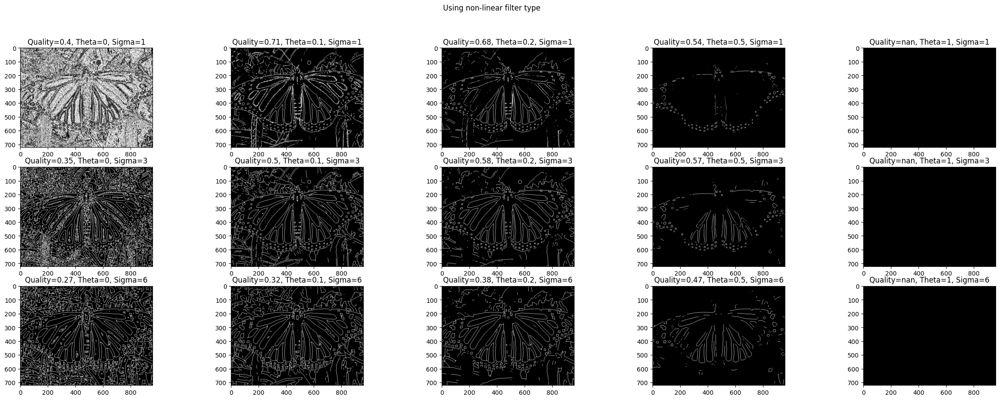

In [50]:
#Testing for several sigmas and thetas
thetas = [0, 0.1, 0.2, 0.5, 1]
sigmas = [1, 3, 6]
filter = ['linear','non-linear']

real_edges = real_edges_detect(gray_image, 0.1)

for f in filters:
  fig, axis = plt.subplots(len(sigmas),len(thetas),figsize=(30,10))
  for i,s in enumerate(sigmas):
    for j,th in enumerate(thetas):
      detected_edges = EdgeDetect(gray_image,sigma=s,theta=th,type_of_filter=f)
      quality = detection_quality(real_edges,detected_edges)
      axis[i][j].imshow(detected_edges,cmap='gray')
      axis[i][j].set_title(f"Quality={round(quality,2)}, Theta={th}, Sigma={s}")
  fig.suptitle(f"Using {f} filter type")
  plt.show()
  print('\n')

Text(0.5, 1.0, 'Non-linear filter, sigma=1, theta=0.1')

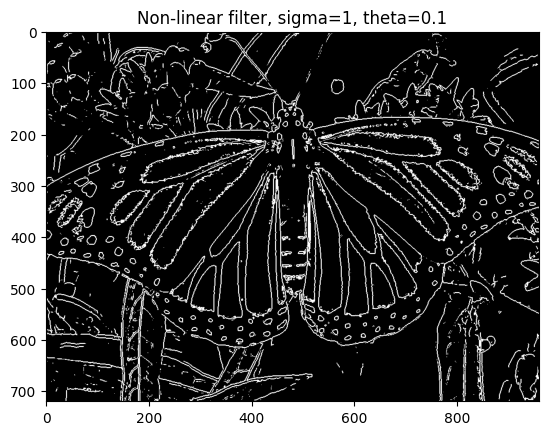

In [51]:
#our best result
best_edges = EdgeDetect(gray_image,sigma=1,theta=0.1,type_of_filter='non-linear')
plt.imshow(best_edges,cmap='gray')
plt.title("Non-linear filter, sigma=1, theta=0.1")